# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features) # (1000, 25)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [4]:
block = get_generator_block(25, 12)
block

Sequential(
  (0): Linear(in_features=25, out_features=12, bias=True)
  (1): BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
)

Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [5]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()

            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [6]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim) # (1000, 784)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


In [7]:
gen = Generator(5, 10, 20).get_gen()
gen

Sequential(
  (0): Sequential(
    (0): Linear(in_features=5, out_features=20, bias=True)
    (1): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (1): Sequential(
    (0): Linear(in_features=20, out_features=40, bias=True)
    (1): BatchNorm1d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (2): Sequential(
    (0): Linear(in_features=40, out_features=80, bias=True)
    (1): BatchNorm1d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (3): Sequential(
    (0): Linear(in_features=80, out_features=160, bias=True)
    (1): BatchNorm1d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (4): Linear(in_features=160, out_features=10, bias=True)
  (5): Sigmoid()
)

## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [8]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim).to(device) ##### None
    #### END CODE HERE ####

In [9]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim) # (1000, 100)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


In [10]:
noise = get_noise(1000, 100, device='cpu')
print(noise.shape)
noise.device

torch.Size([1000, 100])


device(type='cpu')

## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [11]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [12]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2    
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [13]:
block = get_discriminator_block(input_dim=25, output_dim=12)
block

Sequential(
  (0): Linear(in_features=25, out_features=12, bias=True)
  (1): LeakyReLU(negative_slope=0.2)
)

Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.

In [14]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)

            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [15]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [16]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [17]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [18]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    # 1)
    noise_vec = get_noise(num_images, z_dim, device)
    fake_img = gen(noise_vec).detach()
    # 2)
    fake_pred = disc(fake_img)
    fake_labels = torch.zeros(num_images, 1).to(device) # torch.zeros_like
    fake_loss = criterion(fake_pred, fake_labels)
    # 3)
    real_pred = disc(real)
    real_label = torch.ones(num_images, 1).to(device) # torch.ones_like
    real_loss = criterion(real_pred, real_label)
    # 4)
    disc_loss = (fake_loss + real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [19]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [20]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    # 1)
    noise_vec = get_noise(num_images, z_dim, device)
    fake_img = gen(noise_vec) # detach 빠져야됨
    # 2)
    fake_pred = disc(fake_img)
    real_label = torch.ones(num_images, 1).to(device)
    # 3)
    gen_loss = criterion(fake_pred, real_label)
    #### END CODE HERE ####
    return gen_loss

In [21]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))
    

test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Epoch 1, step 500: Generator loss: 1.3539222183227548, discriminator loss: 0.41572629404068023


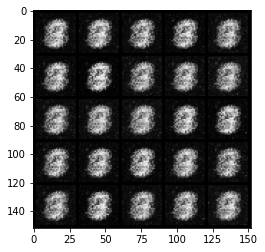

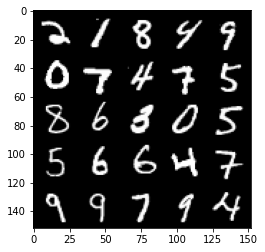

Epoch 2, step 1000: Generator loss: 1.7161741316318515, discriminator loss: 0.2856172654032706


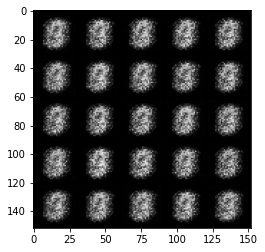

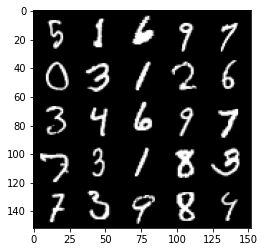

Epoch 3, step 1500: Generator loss: 1.9280738072395327, discriminator loss: 0.18180011239647853


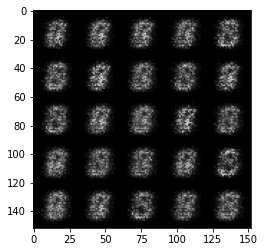

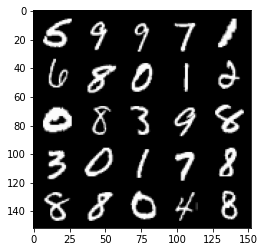

Epoch 4, step 2000: Generator loss: 1.6814244275093084, discriminator loss: 0.22220124304294572


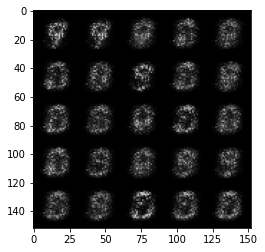

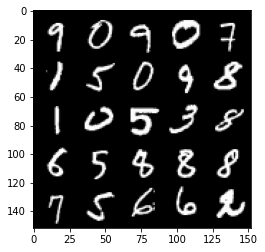

Epoch 5, step 2500: Generator loss: 1.6770004115104669, discriminator loss: 0.20687081041932096


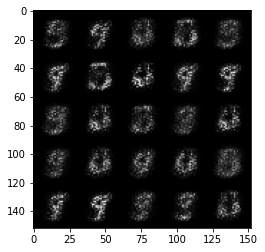

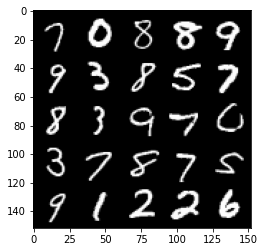

Epoch 6, step 3000: Generator loss: 1.9476370103359215, discriminator loss: 0.16879079803824418


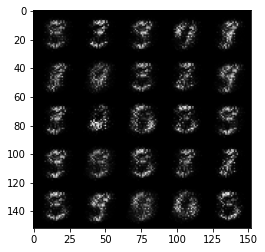

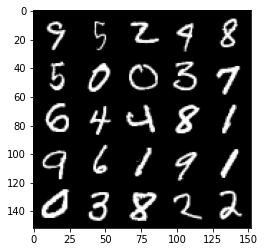

Epoch 7, step 3500: Generator loss: 2.3117436797618867, discriminator loss: 0.13571228240430366


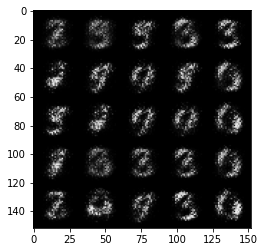

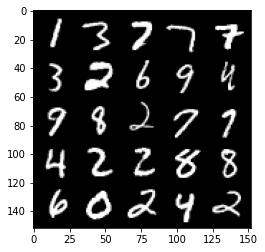

Epoch 8, step 4000: Generator loss: 2.689192391872407, discriminator loss: 0.12282133272290233


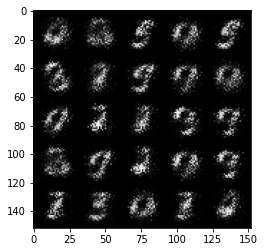

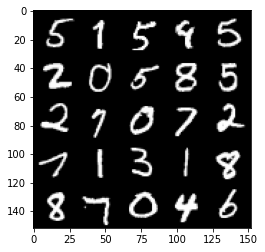

Epoch 9, step 4500: Generator loss: 2.9881290740966815, discriminator loss: 0.10592091108858578


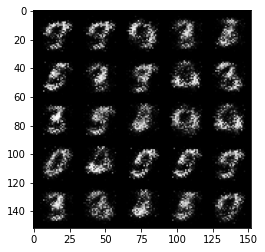

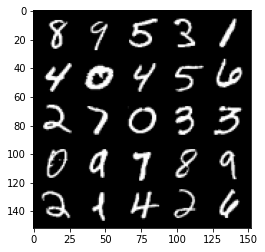

Epoch 10, step 5000: Generator loss: 3.2870379061698913, discriminator loss: 0.09442122777551401


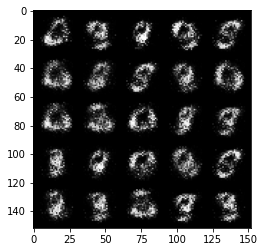

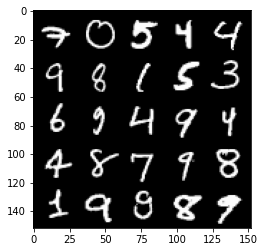

Epoch 11, step 5500: Generator loss: 3.602581715583801, discriminator loss: 0.07838161484897141


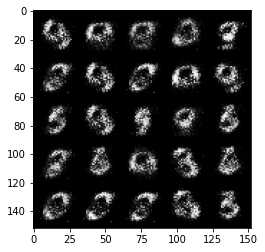

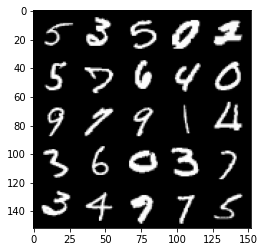

Epoch 12, step 6000: Generator loss: 3.7126964888572687, discriminator loss: 0.06850513509660956


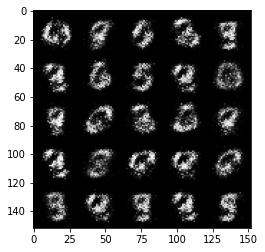

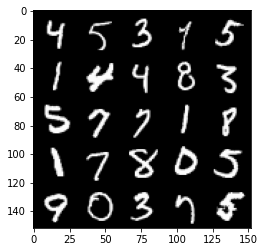

Epoch 13, step 6500: Generator loss: 3.9770430059432957, discriminator loss: 0.05935164165124293


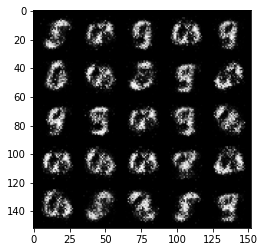

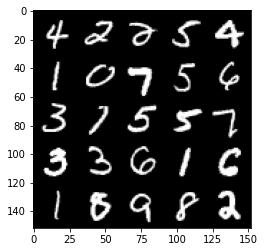

Epoch 14, step 7000: Generator loss: 4.041773594856265, discriminator loss: 0.07013697112351651


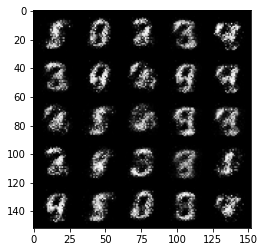

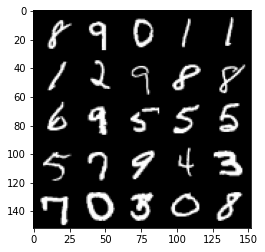

Epoch 15, step 7500: Generator loss: 4.2255186128616335, discriminator loss: 0.055330868467688595


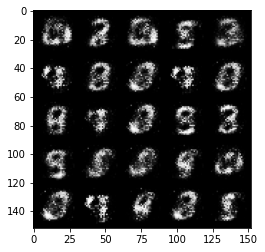

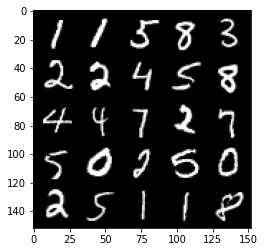

Epoch 17, step 8000: Generator loss: 4.06004016828537, discriminator loss: 0.061268615588545815


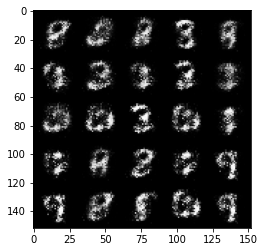

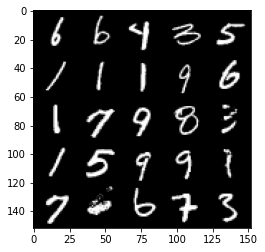

Epoch 18, step 8500: Generator loss: 4.016374554634096, discriminator loss: 0.06123876570165155


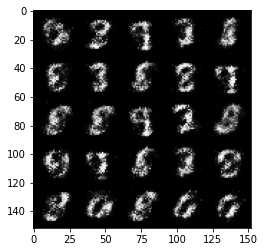

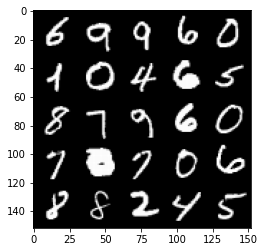

Epoch 19, step 9000: Generator loss: 3.988976743698119, discriminator loss: 0.06501667860150338


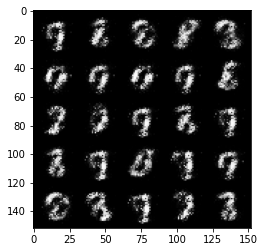

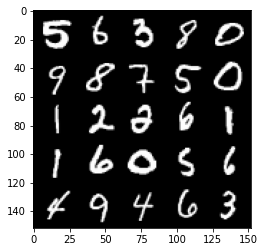

Epoch 20, step 9500: Generator loss: 4.175226504325863, discriminator loss: 0.059595891479402814


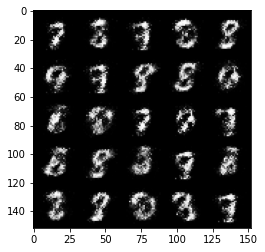

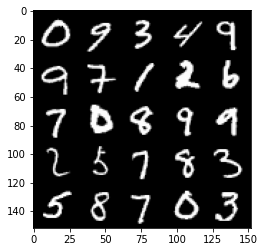

Epoch 21, step 10000: Generator loss: 4.2177744846344, discriminator loss: 0.06661941711604599


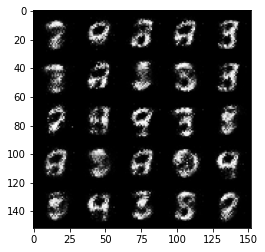

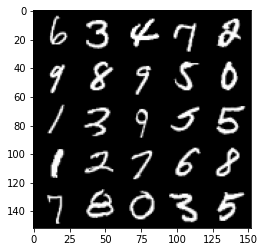

Epoch 22, step 10500: Generator loss: 4.039433392524721, discriminator loss: 0.06924388455599549


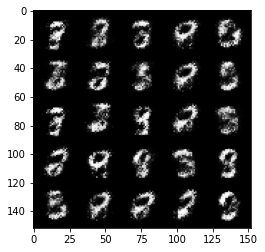

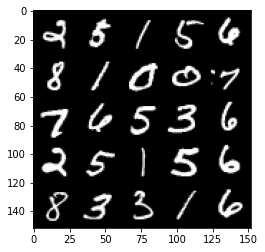

Epoch 23, step 11000: Generator loss: 4.174241083621984, discriminator loss: 0.06346954992413521


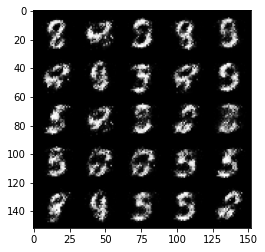

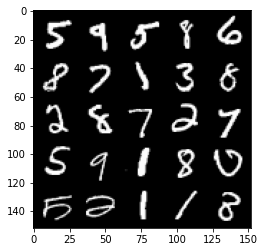

Epoch 24, step 11500: Generator loss: 4.134154860019684, discriminator loss: 0.06808326534181837


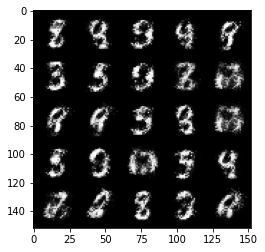

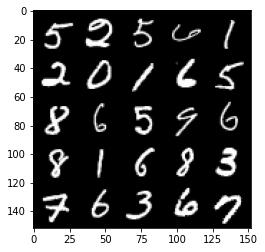

Epoch 25, step 12000: Generator loss: 4.120884629249572, discriminator loss: 0.06227815094962717


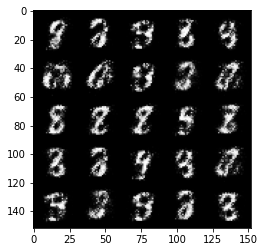

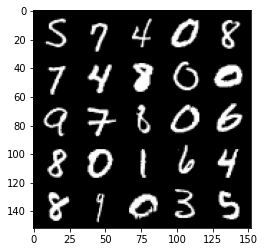

Epoch 26, step 12500: Generator loss: 4.059216705799106, discriminator loss: 0.06430864651128645


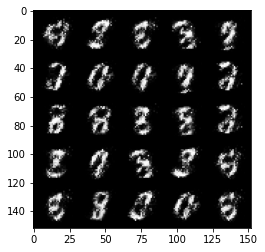

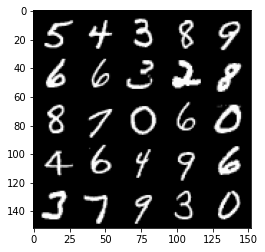

Epoch 27, step 13000: Generator loss: 3.9883114809989912, discriminator loss: 0.07713433624058963


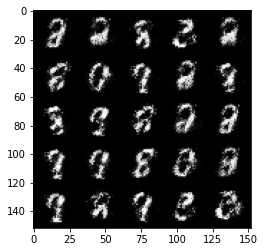

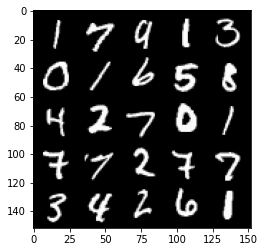

Epoch 28, step 13500: Generator loss: 4.317356037139893, discriminator loss: 0.06375623009353874


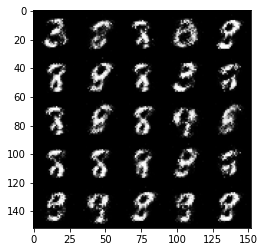

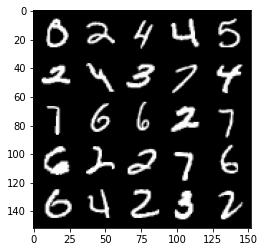

Epoch 29, step 14000: Generator loss: 4.24999845933914, discriminator loss: 0.07456118036061524


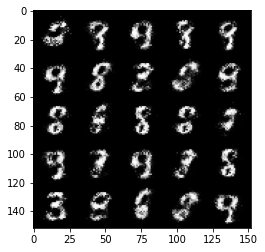

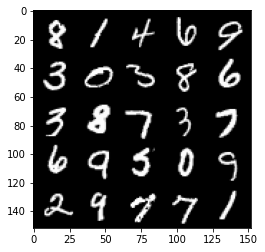

Epoch 30, step 14500: Generator loss: 3.9823684024810815, discriminator loss: 0.08716265022754677


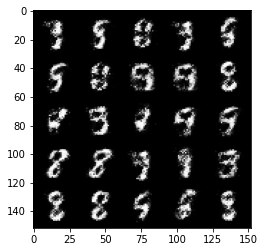

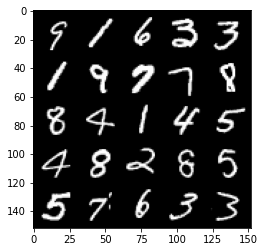

Epoch 31, step 15000: Generator loss: 3.9174342761039718, discriminator loss: 0.08340345234423877


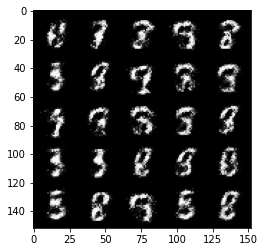

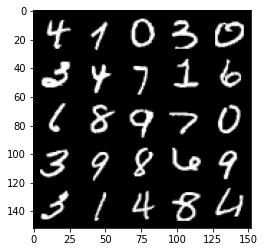

Epoch 33, step 15500: Generator loss: 3.9491940922737094, discriminator loss: 0.10302618593722582


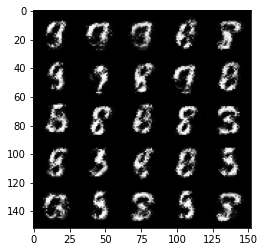

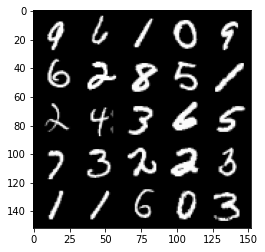

Epoch 34, step 16000: Generator loss: 3.8319704661369314, discriminator loss: 0.10130596737563614


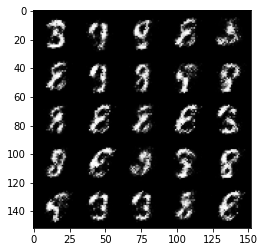

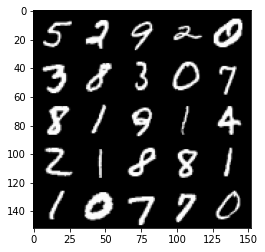

Epoch 35, step 16500: Generator loss: 3.9446344294548012, discriminator loss: 0.10192395754158497


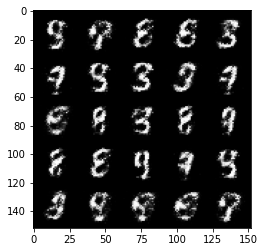

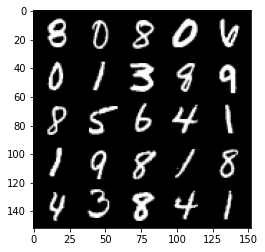

Epoch 36, step 17000: Generator loss: 3.7990931801795944, discriminator loss: 0.10342210067808619


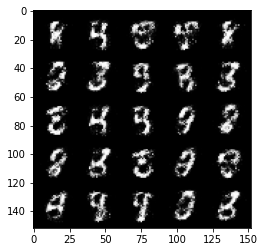

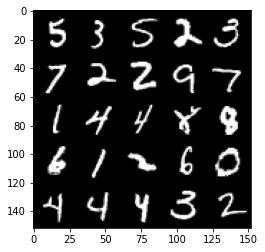

Epoch 37, step 17500: Generator loss: 3.964100439071653, discriminator loss: 0.09841463240981095


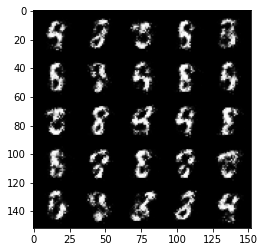

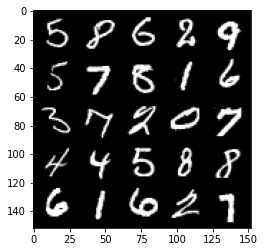

Epoch 38, step 18000: Generator loss: 3.8352135634422306, discriminator loss: 0.09834634497761725


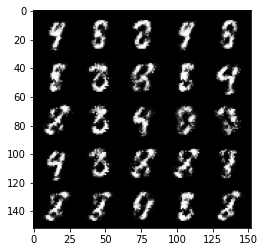

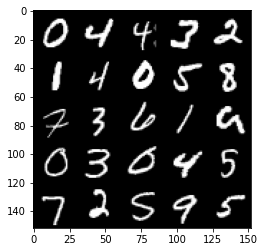

Epoch 39, step 18500: Generator loss: 3.7214587397575363, discriminator loss: 0.11162983985245226


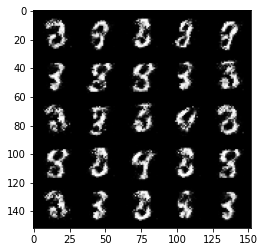

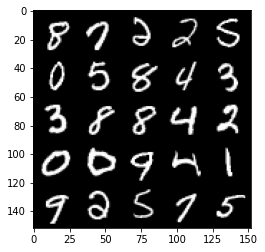

Epoch 40, step 19000: Generator loss: 3.6728937745094323, discriminator loss: 0.11684746284782889


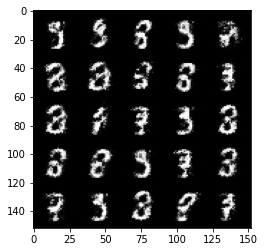

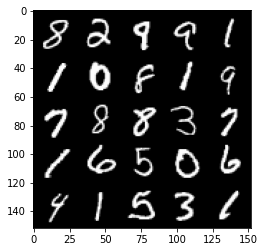

Epoch 41, step 19500: Generator loss: 3.7054511880874643, discriminator loss: 0.10874682980775842


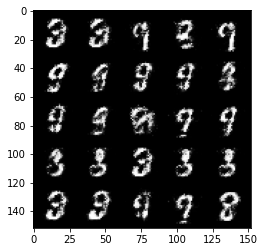

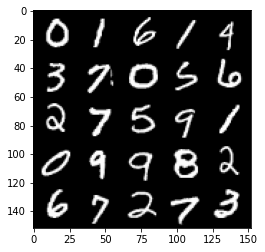

Epoch 42, step 20000: Generator loss: 3.6493505172729463, discriminator loss: 0.12719034440815455


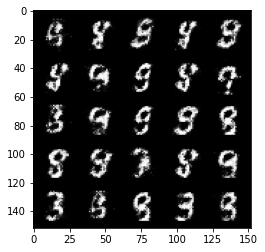

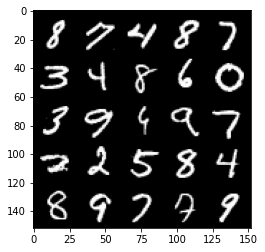

Epoch 43, step 20500: Generator loss: 3.4634290032386787, discriminator loss: 0.15061876535415655


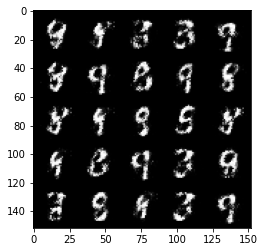

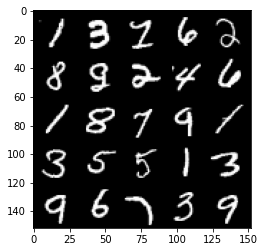

Epoch 44, step 21000: Generator loss: 3.2807973074913055, discriminator loss: 0.1420585094243287


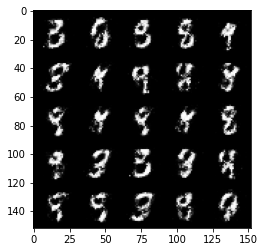

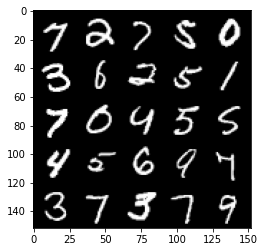

Epoch 45, step 21500: Generator loss: 3.2646908755302486, discriminator loss: 0.15186931870877748


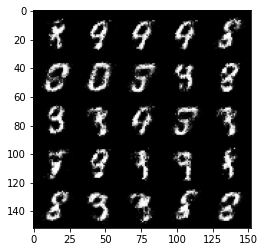

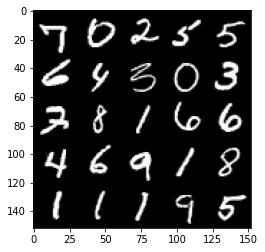

Epoch 46, step 22000: Generator loss: 3.174273471832274, discriminator loss: 0.17205038073658954


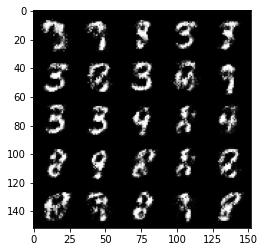

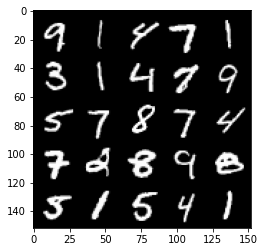

Epoch 47, step 22500: Generator loss: 3.033098042011263, discriminator loss: 0.17262858992815003


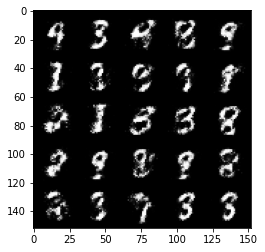

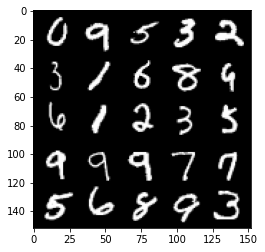

Epoch 49, step 23000: Generator loss: 3.3122490477561977, discriminator loss: 0.14679895886778832


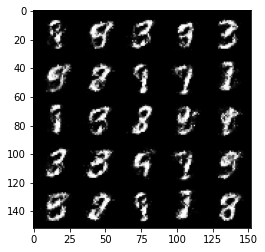

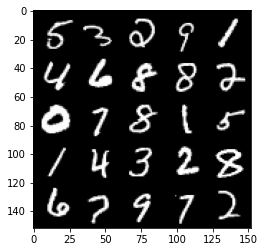

Epoch 50, step 23500: Generator loss: 3.2299512400627135, discriminator loss: 0.1569442230463029


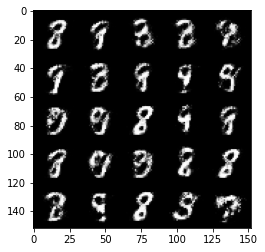

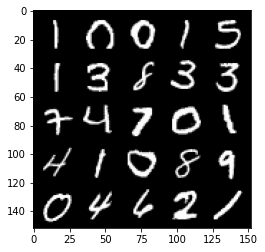

Epoch 51, step 24000: Generator loss: 3.005408019065856, discriminator loss: 0.1911270527392627


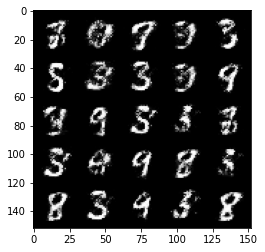

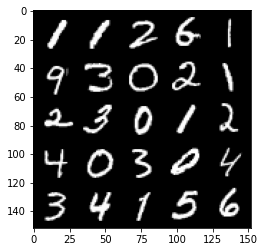

Epoch 52, step 24500: Generator loss: 2.9179114375114423, discriminator loss: 0.18628399376571173


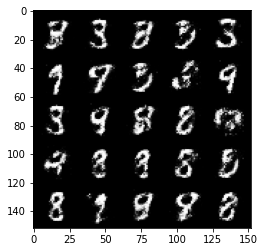

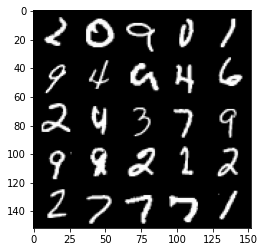

Epoch 53, step 25000: Generator loss: 2.9837561631202703, discriminator loss: 0.17257158304750925


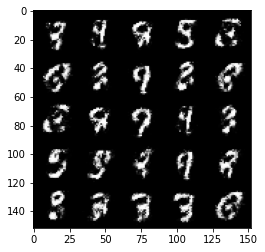

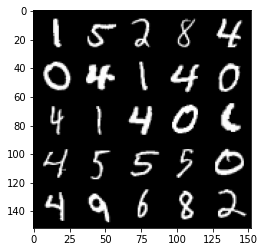

Epoch 54, step 25500: Generator loss: 2.834964852333069, discriminator loss: 0.19960861882567407


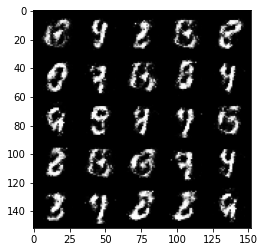

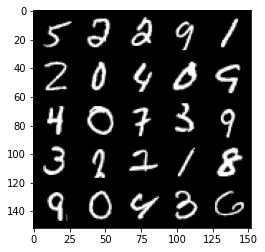

Epoch 55, step 26000: Generator loss: 3.0178796262741074, discriminator loss: 0.18953163187205807


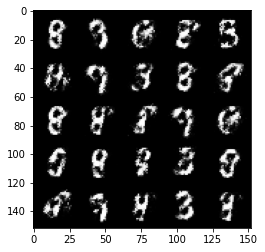

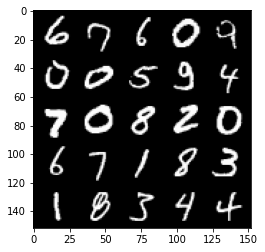

Epoch 56, step 26500: Generator loss: 3.0160258245468183, discriminator loss: 0.1851858308762312


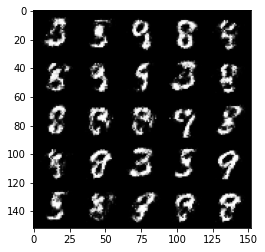

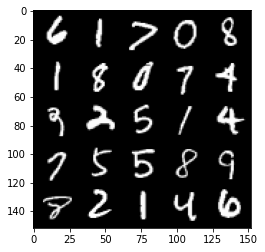

Epoch 57, step 27000: Generator loss: 2.866479751110075, discriminator loss: 0.20181833675503716


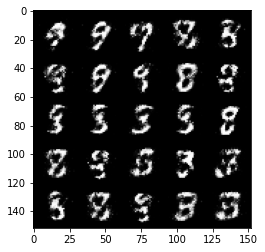

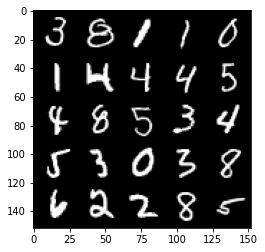

Epoch 58, step 27500: Generator loss: 2.9324024662971504, discriminator loss: 0.18686431077122673


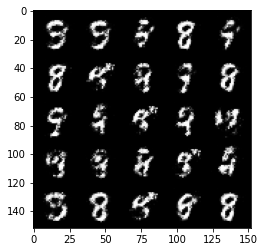

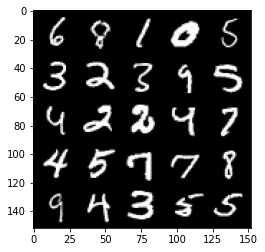

Epoch 59, step 28000: Generator loss: 2.949139248371127, discriminator loss: 0.1879404143244028


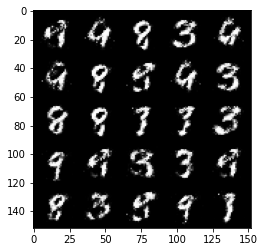

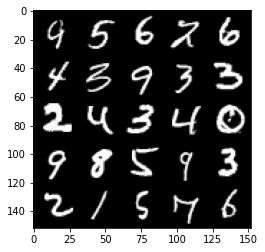

Epoch 60, step 28500: Generator loss: 2.9031682667732266, discriminator loss: 0.19267646408081038


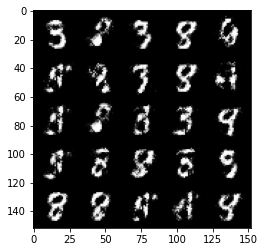

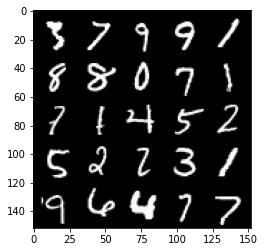

Epoch 61, step 29000: Generator loss: 2.852544528007507, discriminator loss: 0.19512813322246092


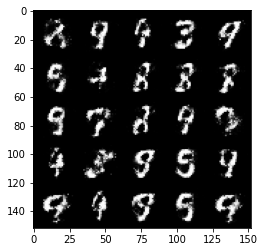

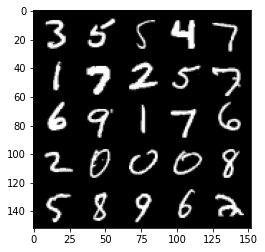

Epoch 62, step 29500: Generator loss: 2.7636479425430287, discriminator loss: 0.201289011657238


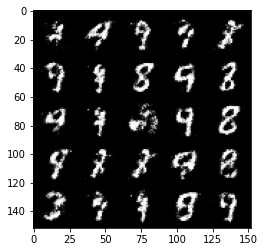

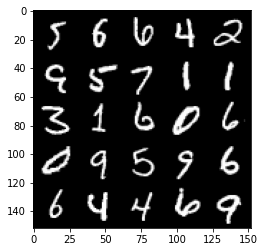

Epoch 63, step 30000: Generator loss: 2.7434431967735295, discriminator loss: 0.20362556359171874


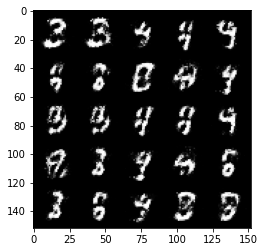

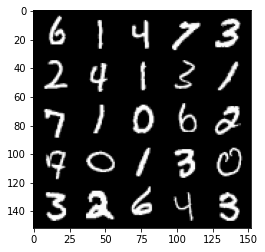

Epoch 65, step 30500: Generator loss: 2.8851693763732884, discriminator loss: 0.183387939825654


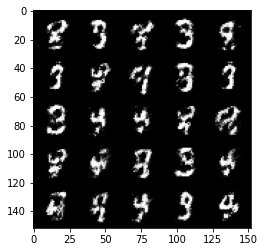

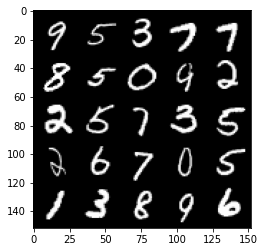

Epoch 66, step 31000: Generator loss: 2.9168045635223416, discriminator loss: 0.17633953097462657


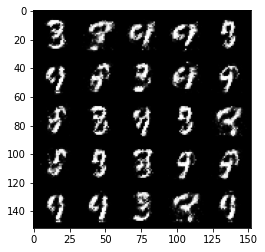

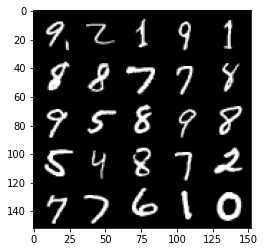

Epoch 67, step 31500: Generator loss: 2.8377185978889474, discriminator loss: 0.20071209970116596


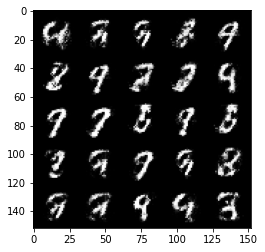

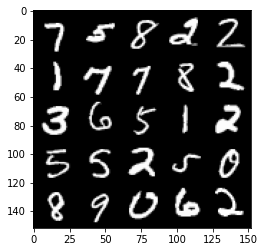

Epoch 68, step 32000: Generator loss: 2.622430796146393, discriminator loss: 0.22217270609736425


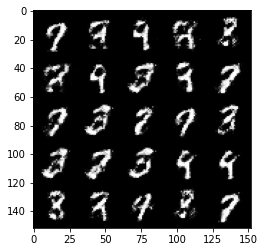

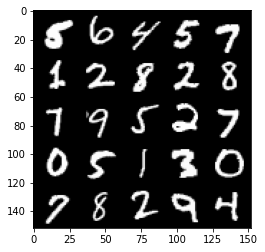

Epoch 69, step 32500: Generator loss: 2.6860821022987396, discriminator loss: 0.21888352981209735


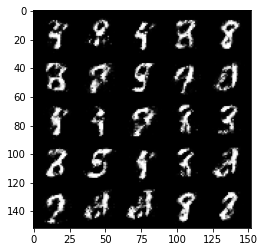

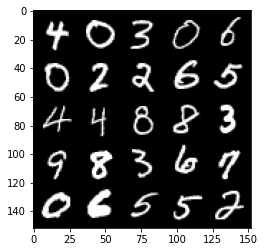

Epoch 70, step 33000: Generator loss: 2.55770910024643, discriminator loss: 0.244066331088543


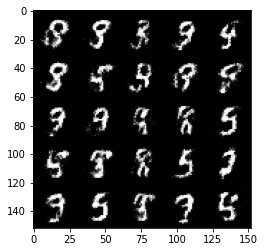

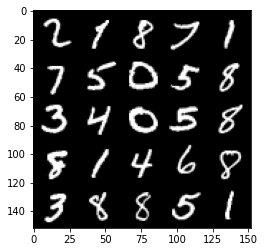

Epoch 71, step 33500: Generator loss: 2.6865373878479017, discriminator loss: 0.21274331730604168


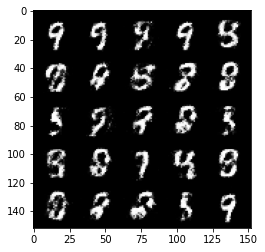

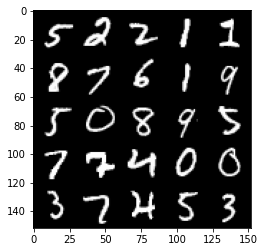

Epoch 72, step 34000: Generator loss: 2.652006242752076, discriminator loss: 0.2056208468377592


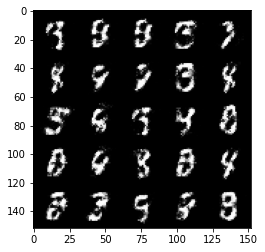

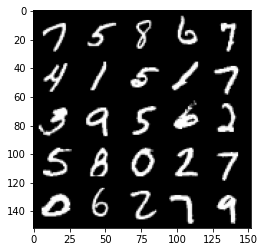

Epoch 73, step 34500: Generator loss: 2.6906042699813844, discriminator loss: 0.21042838941514494


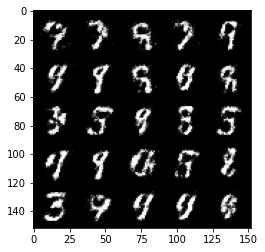

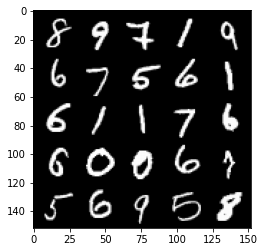

Epoch 74, step 35000: Generator loss: 2.4344539010524744, discriminator loss: 0.24732107058167455


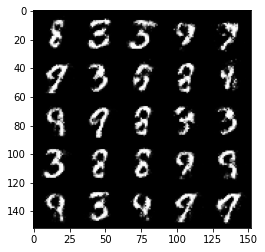

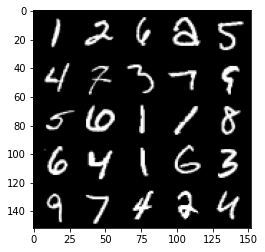

Epoch 75, step 35500: Generator loss: 2.4590795946121204, discriminator loss: 0.2335258664190772


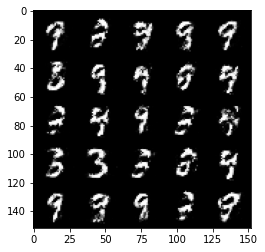

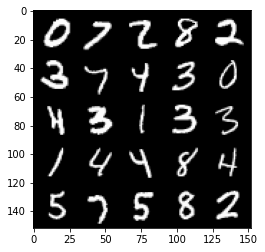

Epoch 76, step 36000: Generator loss: 2.5585404102802274, discriminator loss: 0.2305007889568807


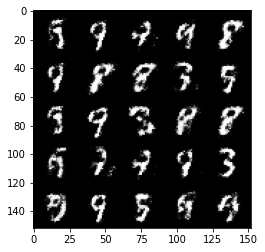

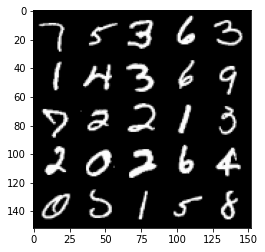

Epoch 77, step 36500: Generator loss: 2.543145614147187, discriminator loss: 0.24135918003320697


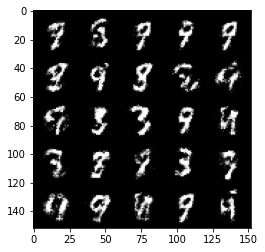

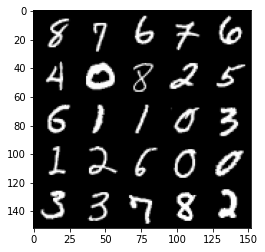

Epoch 78, step 37000: Generator loss: 2.533188349723814, discriminator loss: 0.22982595281302942


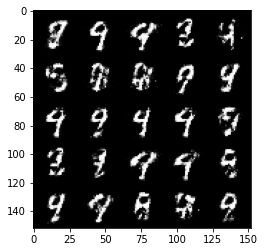

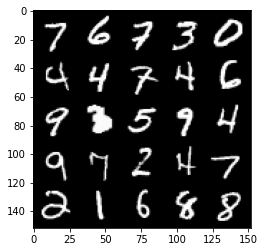

Epoch 79, step 37500: Generator loss: 2.5181326160430895, discriminator loss: 0.24354764486849298


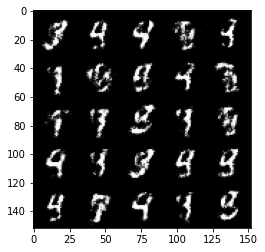

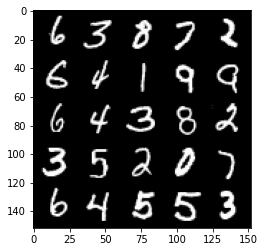

Epoch 81, step 38000: Generator loss: 2.3986899185180692, discriminator loss: 0.24820979973673815


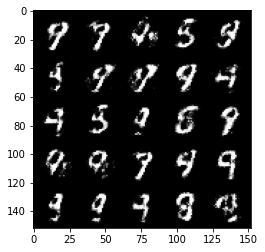

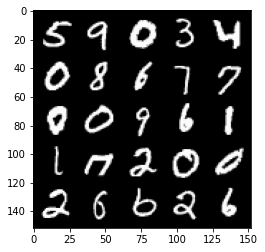

Epoch 82, step 38500: Generator loss: 2.3743875288963316, discriminator loss: 0.2598199241161347


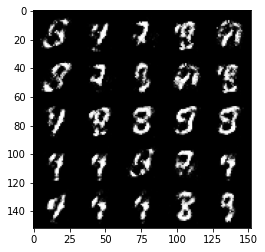

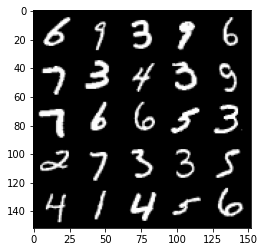

Epoch 83, step 39000: Generator loss: 2.374487856149674, discriminator loss: 0.25818580991029755


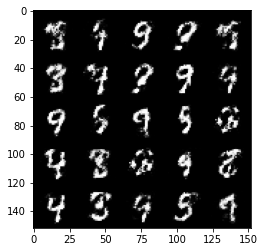

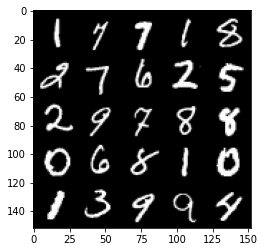

Epoch 84, step 39500: Generator loss: 2.2135509896278376, discriminator loss: 0.28552975627779925


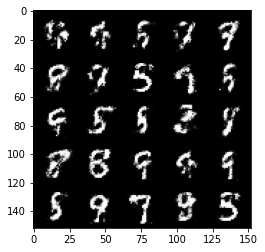

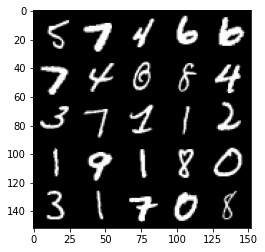

Epoch 85, step 40000: Generator loss: 2.290506320714951, discriminator loss: 0.26819589367508895


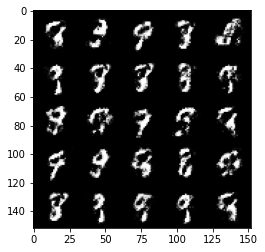

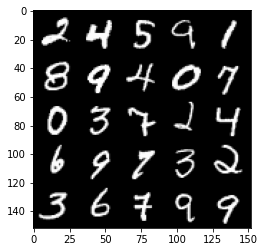

Epoch 86, step 40500: Generator loss: 2.308343093633651, discriminator loss: 0.26832569500803954


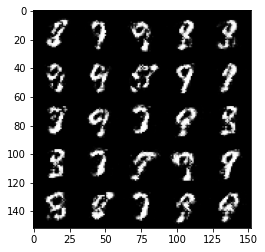

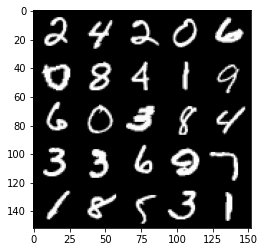

Epoch 87, step 41000: Generator loss: 2.31617261219025, discriminator loss: 0.2700734086930755


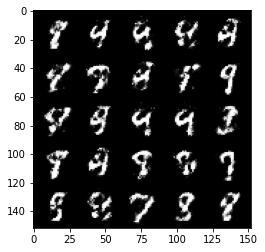

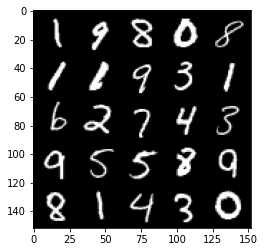

Epoch 88, step 41500: Generator loss: 2.3342162008285525, discriminator loss: 0.2619091747999194


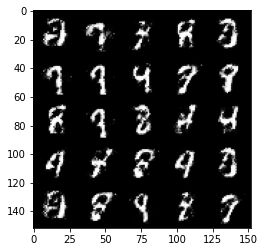

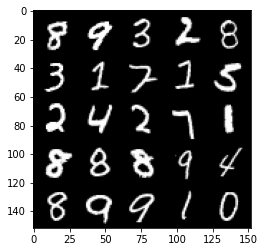

Epoch 89, step 42000: Generator loss: 2.2648919365406046, discriminator loss: 0.27327543169260016


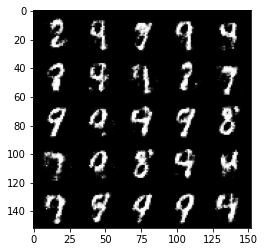

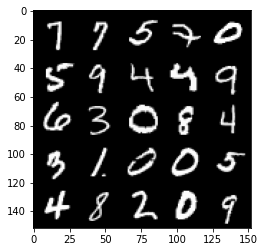

Epoch 90, step 42500: Generator loss: 2.206186124086379, discriminator loss: 0.2743302587270735


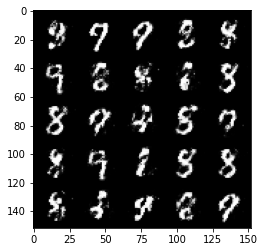

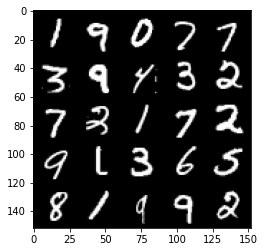

Epoch 91, step 43000: Generator loss: 2.307468220233914, discriminator loss: 0.2510739912390709


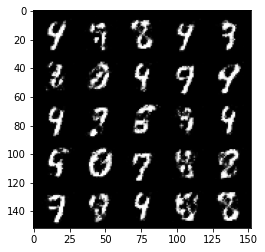

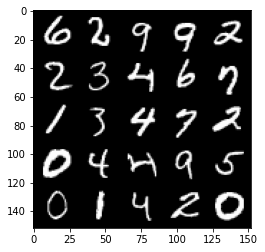

Epoch 92, step 43500: Generator loss: 2.2433499820232363, discriminator loss: 0.2834951788187024


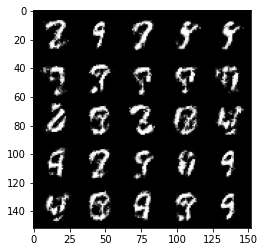

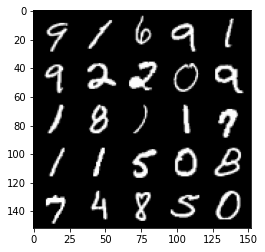

Epoch 93, step 44000: Generator loss: 2.1566533453464505, discriminator loss: 0.2907479607462884


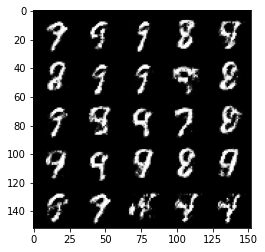

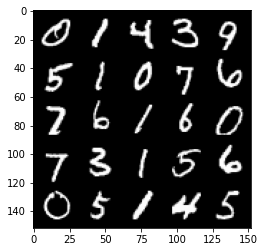

Epoch 94, step 44500: Generator loss: 2.0603048434257496, discriminator loss: 0.30406344941258423


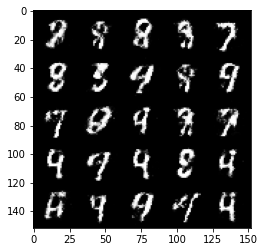

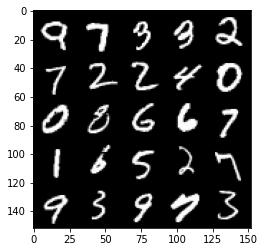

Epoch 95, step 45000: Generator loss: 2.088301951169965, discriminator loss: 0.3038904380202291


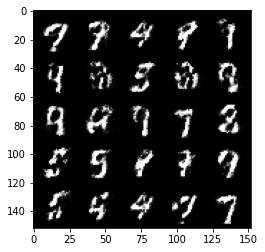

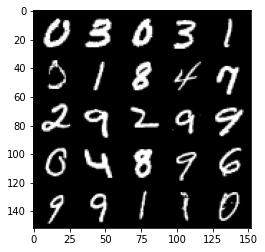

Epoch 97, step 45500: Generator loss: 2.0328571286201496, discriminator loss: 0.3166385742127894


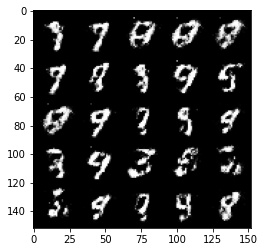

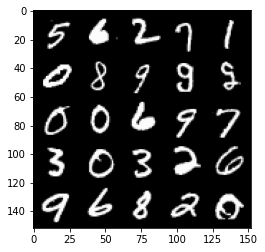

Epoch 98, step 46000: Generator loss: 2.0538811049461363, discriminator loss: 0.31160497286915756


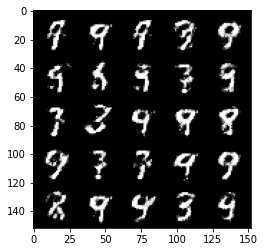

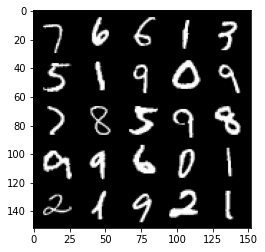

Epoch 99, step 46500: Generator loss: 2.1851519889831543, discriminator loss: 0.2695512268841264


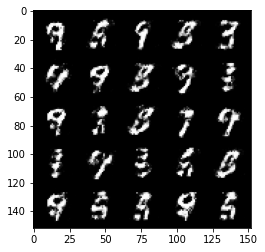

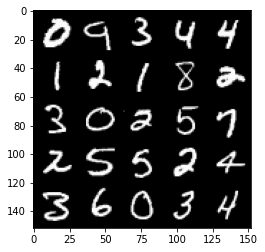

Epoch 100, step 47000: Generator loss: 1.973546832084655, discriminator loss: 0.31390506342053426


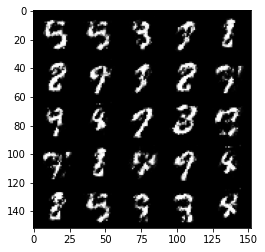

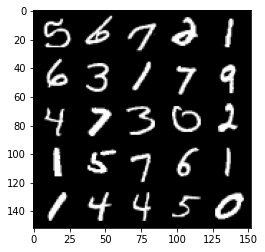

Epoch 101, step 47500: Generator loss: 2.083432910203934, discriminator loss: 0.28601675212383254


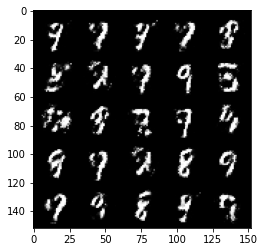

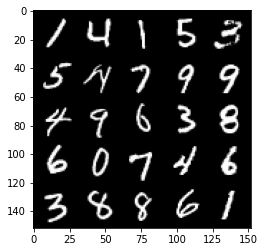

Epoch 102, step 48000: Generator loss: 2.1601366779804234, discriminator loss: 0.2917365561425686


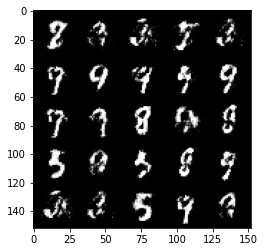

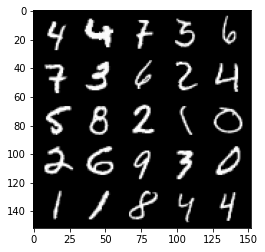

Epoch 103, step 48500: Generator loss: 2.0889091420173656, discriminator loss: 0.2945676083266734


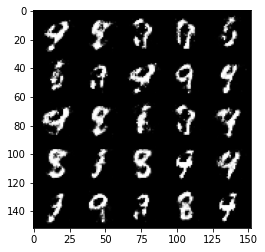

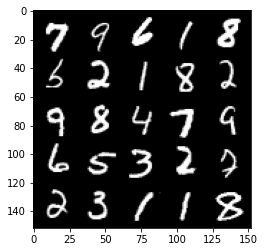

Epoch 104, step 49000: Generator loss: 2.053455847263336, discriminator loss: 0.2997432776987551


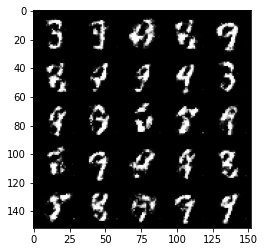

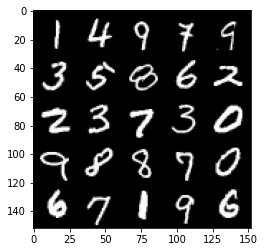

Epoch 105, step 49500: Generator loss: 2.0684183642864222, discriminator loss: 0.29454753020405783


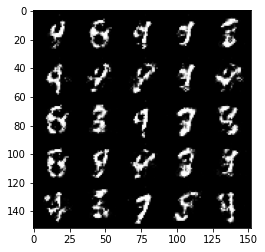

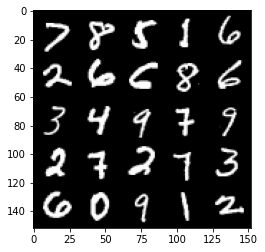

Epoch 106, step 50000: Generator loss: 2.154956037998199, discriminator loss: 0.2894891246557235


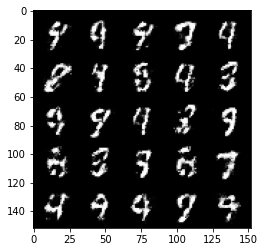

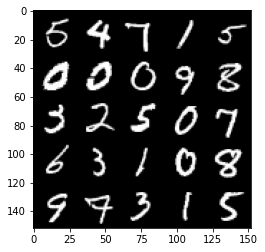

Epoch 107, step 50500: Generator loss: 2.0411756861209875, discriminator loss: 0.3164890664815904


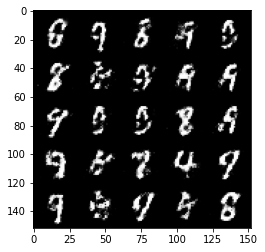

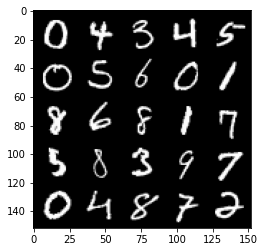

Epoch 108, step 51000: Generator loss: 2.050161195278166, discriminator loss: 0.30695708224177354


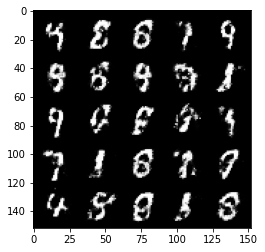

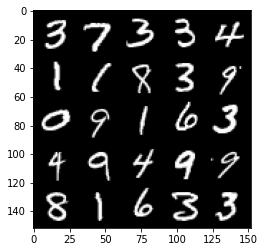

Epoch 109, step 51500: Generator loss: 1.9871065261363976, discriminator loss: 0.3255273297429086


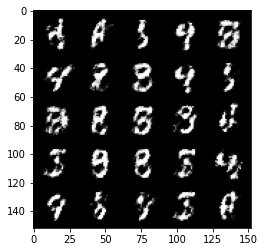

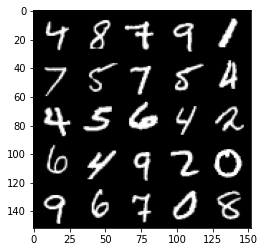

Epoch 110, step 52000: Generator loss: 2.095014462709427, discriminator loss: 0.28855221787095064


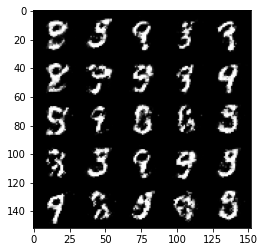

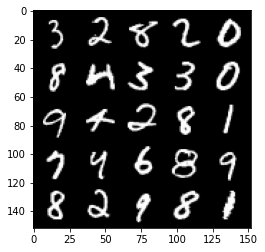

Epoch 111, step 52500: Generator loss: 2.014381978988646, discriminator loss: 0.30319463473558395


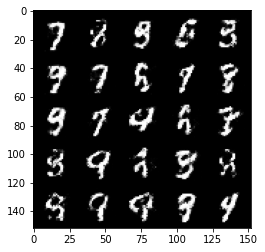

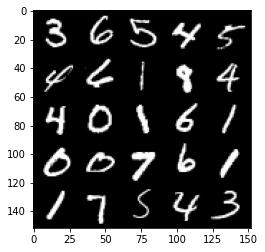

Epoch 113, step 53000: Generator loss: 2.1090975379943853, discriminator loss: 0.28937131637334806


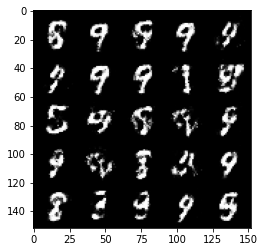

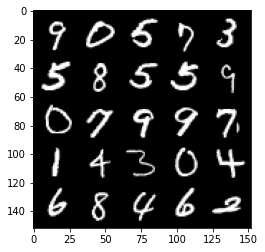

Epoch 114, step 53500: Generator loss: 2.0033197860717777, discriminator loss: 0.3172412837147714


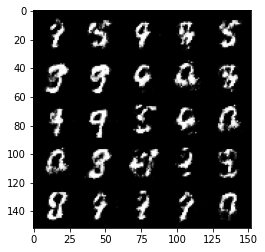

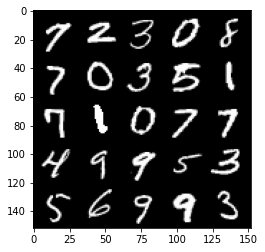

Epoch 115, step 54000: Generator loss: 1.9172954595088965, discriminator loss: 0.330462178260088


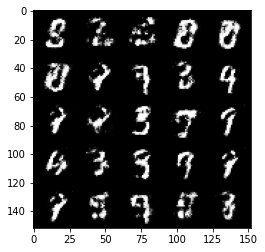

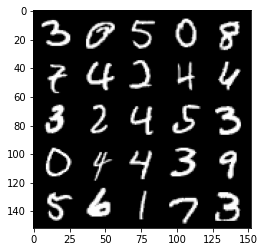

Epoch 116, step 54500: Generator loss: 2.019796564817427, discriminator loss: 0.30617787364125243


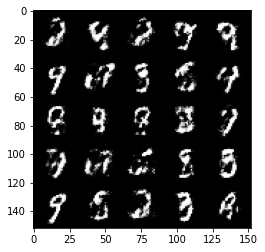

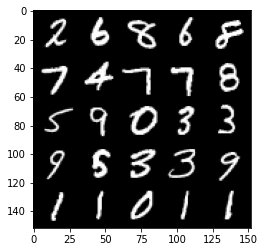

Epoch 117, step 55000: Generator loss: 1.9545383794307702, discriminator loss: 0.33260520035028446


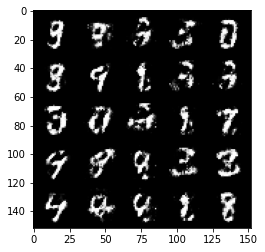

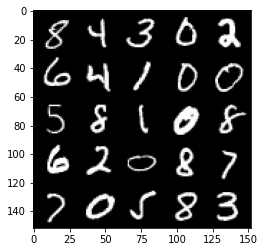

Epoch 118, step 55500: Generator loss: 1.9978818488121048, discriminator loss: 0.3096127987205982


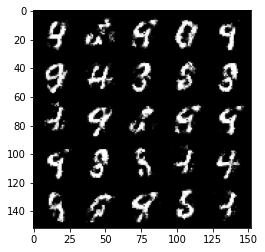

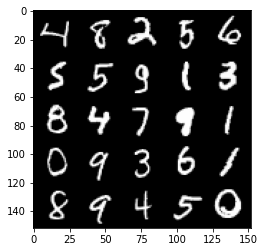

Epoch 119, step 56000: Generator loss: 1.9469364149570463, discriminator loss: 0.3296890917122364


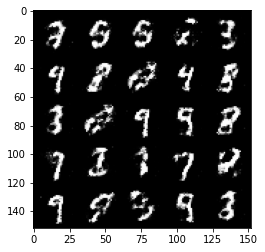

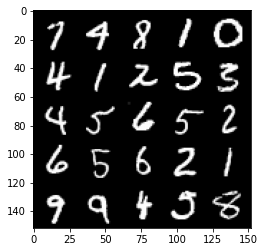

Epoch 120, step 56500: Generator loss: 1.9735658361911756, discriminator loss: 0.30437975645065296


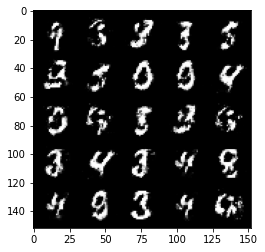

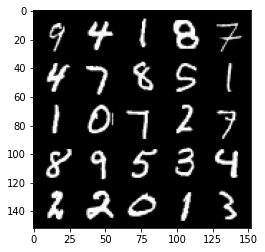

Epoch 121, step 57000: Generator loss: 2.098663549661634, discriminator loss: 0.29094910779595373


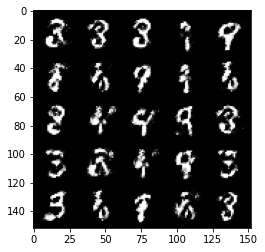

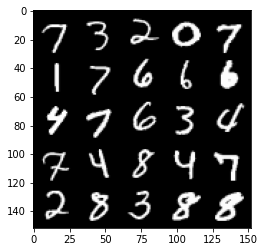

Epoch 122, step 57500: Generator loss: 1.972449583768844, discriminator loss: 0.31451425325870475


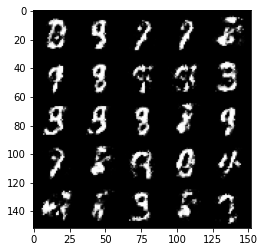

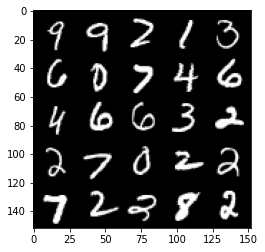

Epoch 123, step 58000: Generator loss: 1.9994204154014594, discriminator loss: 0.30433095958828943


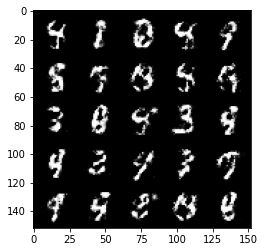

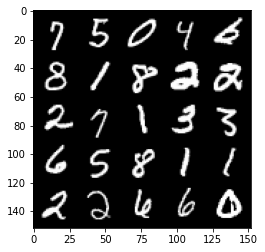

Epoch 124, step 58500: Generator loss: 2.0282620055675498, discriminator loss: 0.30641935169696805


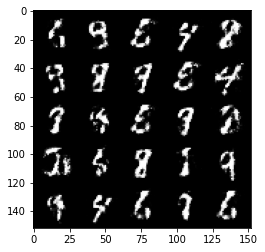

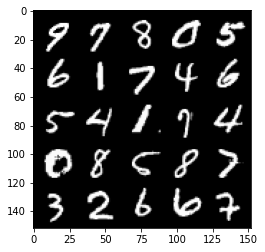

Epoch 125, step 59000: Generator loss: 1.9956034212112415, discriminator loss: 0.305313027948141


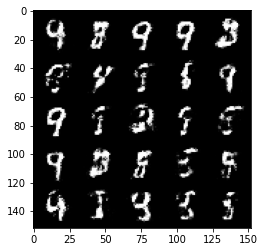

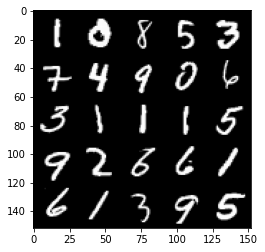

Epoch 126, step 59500: Generator loss: 1.9122941749095916, discriminator loss: 0.334598330914974


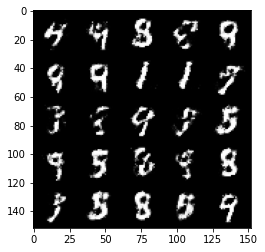

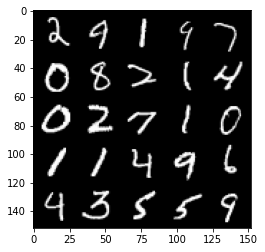

Epoch 127, step 60000: Generator loss: 1.7742233676910404, discriminator loss: 0.3545129425525664


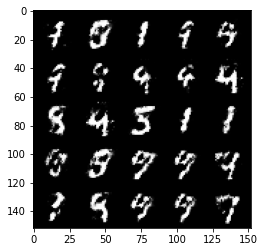

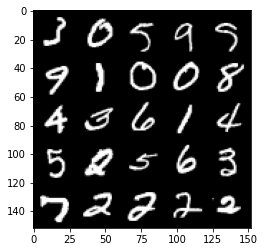

Epoch 128, step 60500: Generator loss: 1.936082854509354, discriminator loss: 0.3212978013157841


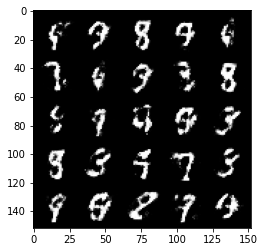

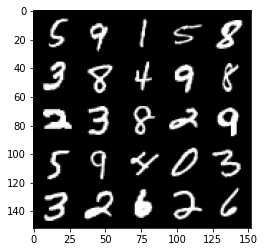

Epoch 130, step 61000: Generator loss: 1.8533540062904363, discriminator loss: 0.3450631768107412


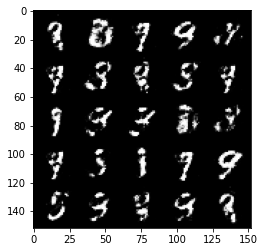

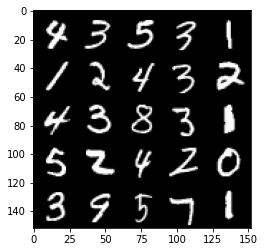

Epoch 131, step 61500: Generator loss: 1.8276002397537225, discriminator loss: 0.3396190010607245


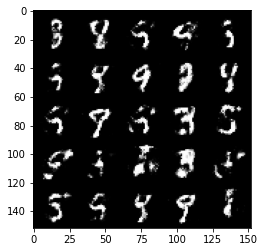

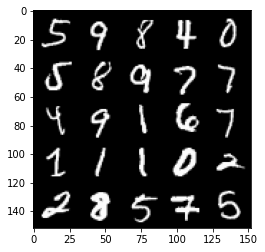

Epoch 132, step 62000: Generator loss: 1.818128793001175, discriminator loss: 0.34040092477202427


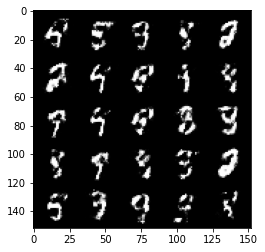

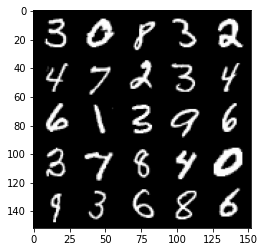

Epoch 133, step 62500: Generator loss: 1.882043594598769, discriminator loss: 0.3433164682686328


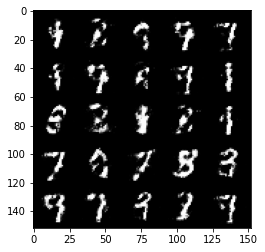

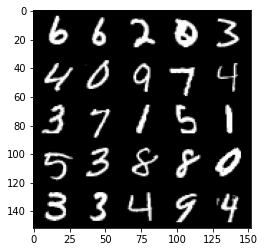

Epoch 134, step 63000: Generator loss: 1.6860378041267396, discriminator loss: 0.37624434316158334


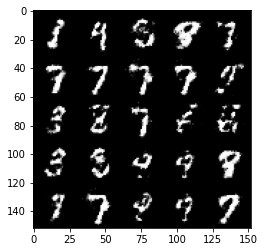

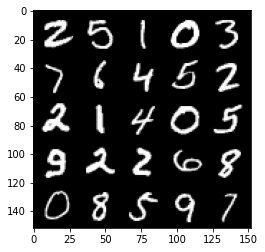

Epoch 135, step 63500: Generator loss: 1.805218079328536, discriminator loss: 0.3457634648084637


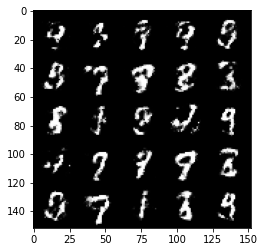

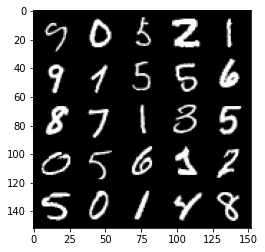

Epoch 136, step 64000: Generator loss: 1.7576190109252934, discriminator loss: 0.35577017462253585


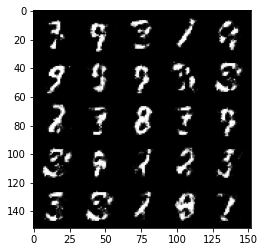

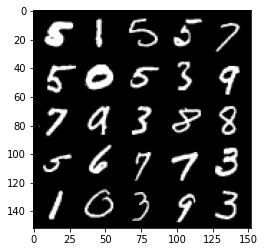

Epoch 137, step 64500: Generator loss: 1.6676501460075397, discriminator loss: 0.384261515319347


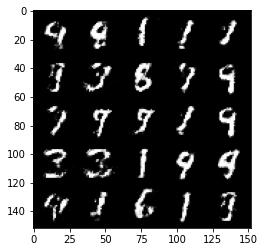

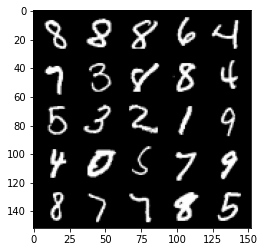

Epoch 138, step 65000: Generator loss: 1.6925031609535217, discriminator loss: 0.37620056432485577


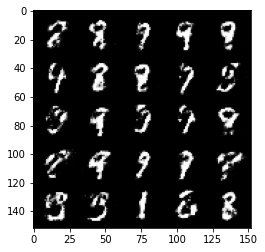

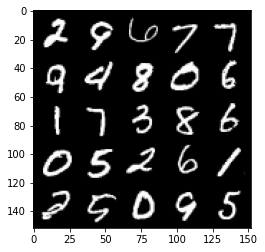

Epoch 139, step 65500: Generator loss: 1.6954706132411952, discriminator loss: 0.38156697446107873


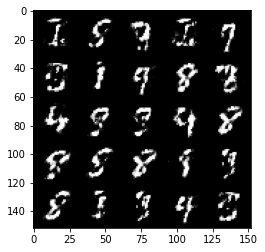

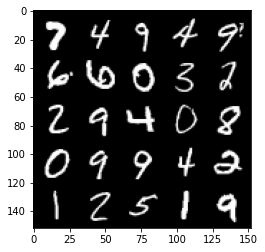

Epoch 140, step 66000: Generator loss: 1.6376015164852127, discriminator loss: 0.38690412211418135


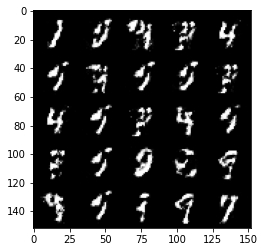

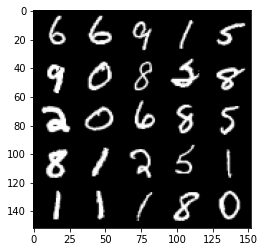

Epoch 141, step 66500: Generator loss: 1.7844847116470348, discriminator loss: 0.3452454217076304


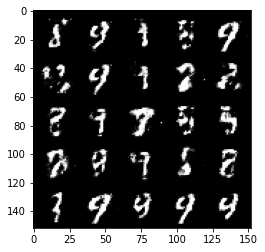

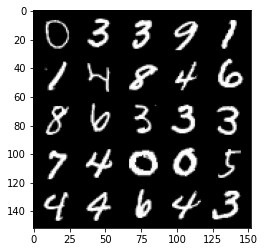

Epoch 142, step 67000: Generator loss: 1.7958362808227537, discriminator loss: 0.3393695921599866


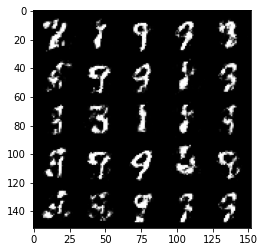

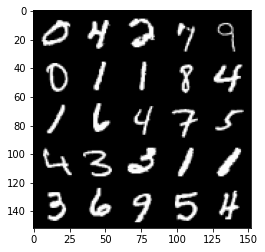

Epoch 143, step 67500: Generator loss: 1.7902972707748415, discriminator loss: 0.35245210838317875


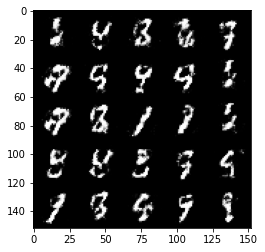

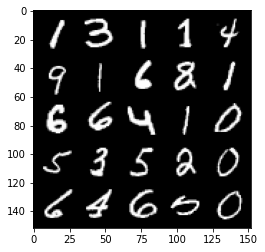

Epoch 144, step 68000: Generator loss: 1.7840483703613277, discriminator loss: 0.3483452199399473


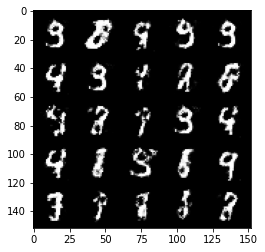

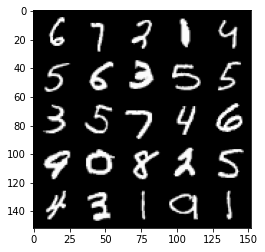

Epoch 146, step 68500: Generator loss: 1.7597897403240224, discriminator loss: 0.3492066352963448


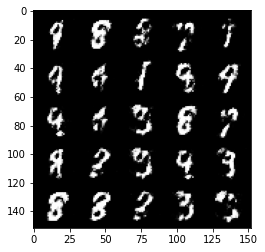

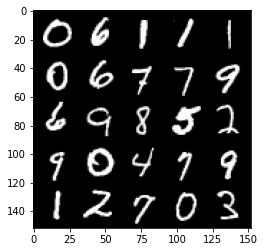

Epoch 147, step 69000: Generator loss: 1.7187511446475983, discriminator loss: 0.3567547340691091


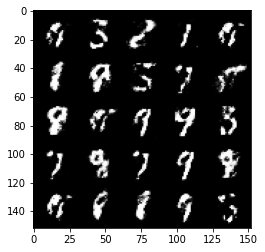

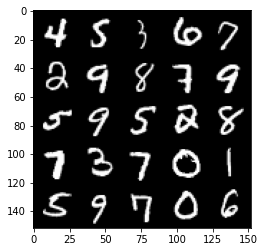

Epoch 148, step 69500: Generator loss: 1.5601257576942449, discriminator loss: 0.40261338794231355


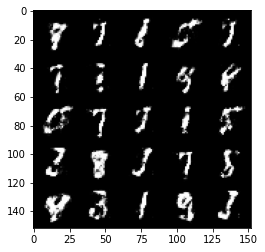

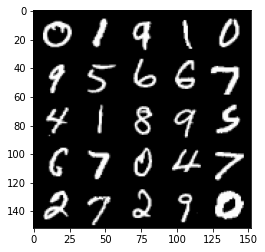

Epoch 149, step 70000: Generator loss: 1.5371901776790626, discriminator loss: 0.4033719513416285


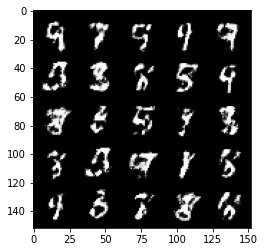

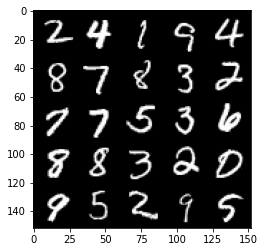

Epoch 150, step 70500: Generator loss: 1.6491270492076884, discriminator loss: 0.3708734199404714


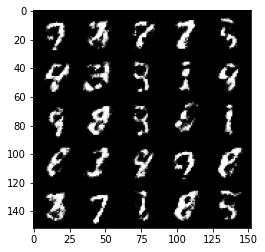

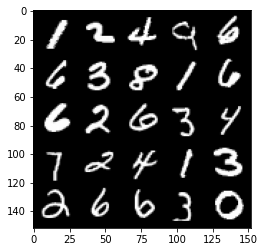

Epoch 151, step 71000: Generator loss: 1.6068518013954152, discriminator loss: 0.3880711402297019


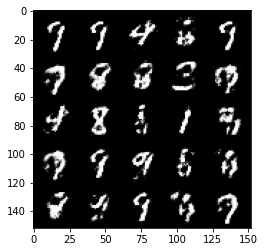

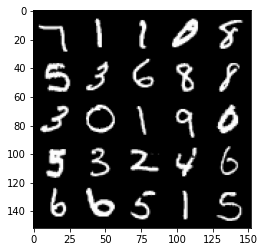

Epoch 152, step 71500: Generator loss: 1.592186730146407, discriminator loss: 0.40972322016954427


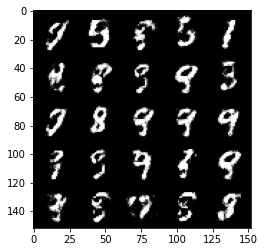

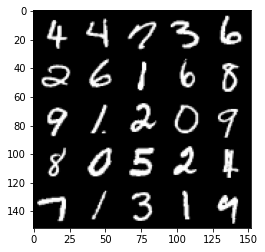

Epoch 153, step 72000: Generator loss: 1.5679343621730804, discriminator loss: 0.3989954677820206


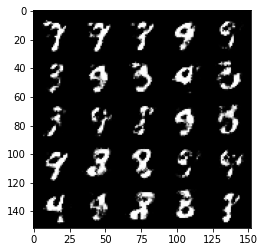

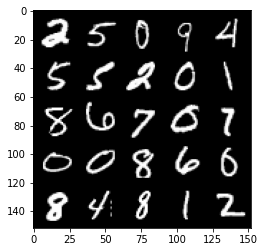

Epoch 154, step 72500: Generator loss: 1.5640196659564962, discriminator loss: 0.4026857398748399


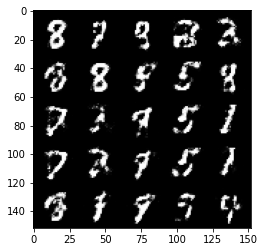

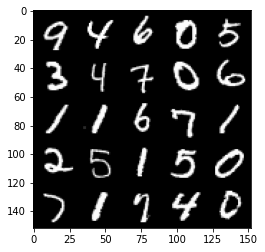

Epoch 155, step 73000: Generator loss: 1.5463087916374207, discriminator loss: 0.4028804687261579


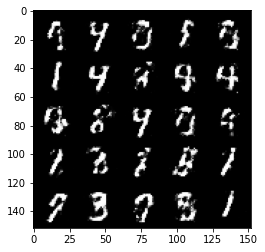

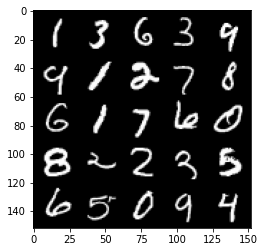

Epoch 156, step 73500: Generator loss: 1.4998036150932303, discriminator loss: 0.4245646872520443


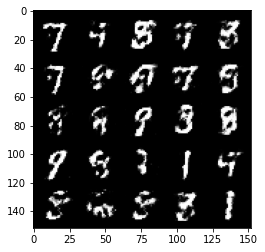

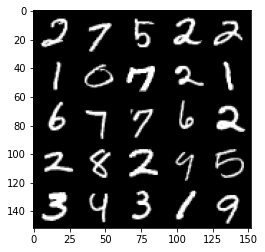

Epoch 157, step 74000: Generator loss: 1.4869426541328439, discriminator loss: 0.42049373662471795


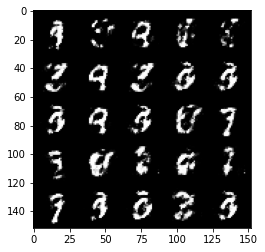

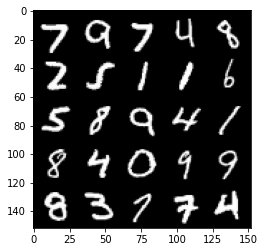

Epoch 158, step 74500: Generator loss: 1.4911373908519747, discriminator loss: 0.42330077302455926


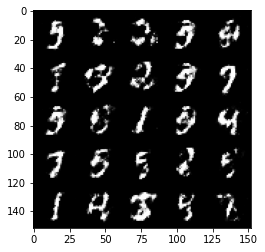

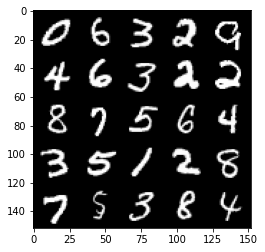

Epoch 159, step 75000: Generator loss: 1.4934979002475728, discriminator loss: 0.4115275869965554


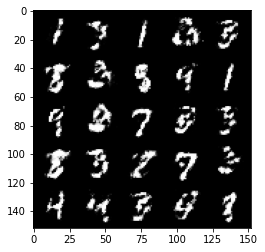

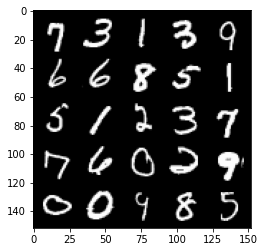

Epoch 160, step 75500: Generator loss: 1.5305364966392532, discriminator loss: 0.4082542341947554


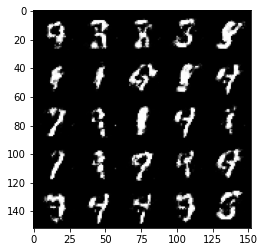

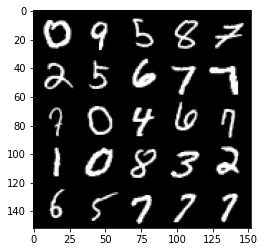

Epoch 162, step 76000: Generator loss: 1.5658316388130176, discriminator loss: 0.39424126797914494


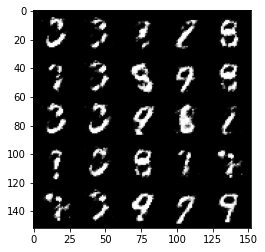

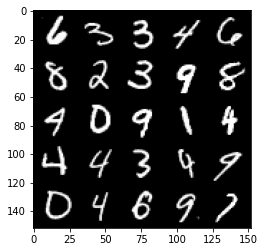

Epoch 163, step 76500: Generator loss: 1.613744441986084, discriminator loss: 0.3828640580177306


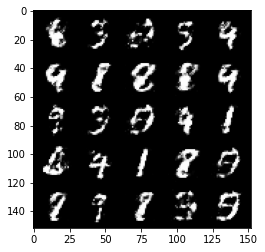

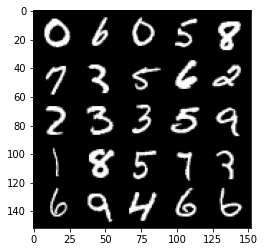

Epoch 164, step 77000: Generator loss: 1.573055126428603, discriminator loss: 0.380570908367634


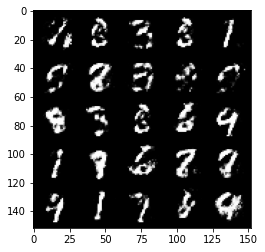

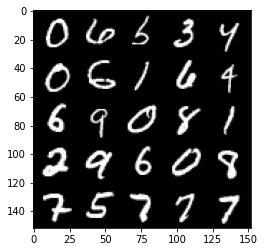

Epoch 165, step 77500: Generator loss: 1.3930756812095653, discriminator loss: 0.44971925950050373


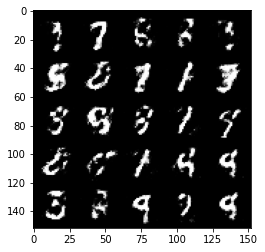

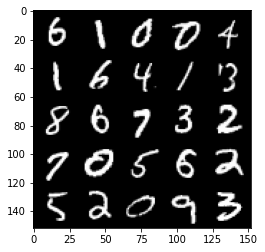

Epoch 166, step 78000: Generator loss: 1.3725887589454655, discriminator loss: 0.4482268843054769


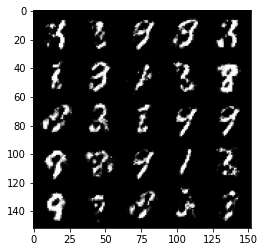

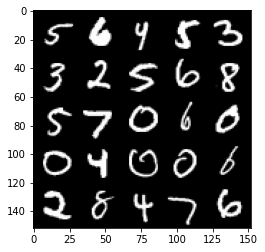

Epoch 167, step 78500: Generator loss: 1.4003346862792942, discriminator loss: 0.4374362422823909


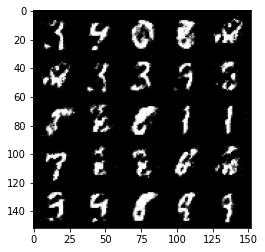

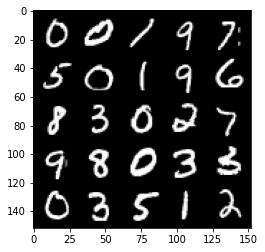

Epoch 168, step 79000: Generator loss: 1.4142823958396895, discriminator loss: 0.43665306389331876


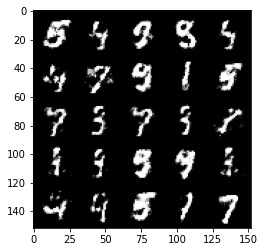

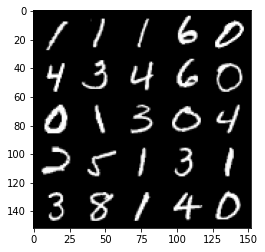

Epoch 169, step 79500: Generator loss: 1.383434841394424, discriminator loss: 0.45433011883497215


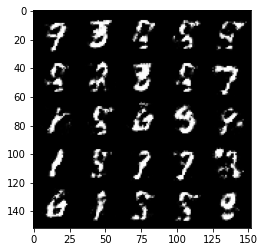

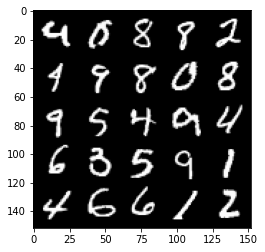

Epoch 170, step 80000: Generator loss: 1.3758556864261633, discriminator loss: 0.4479899776577952


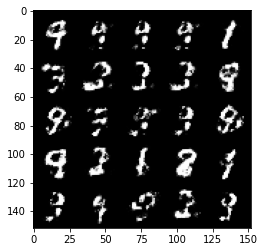

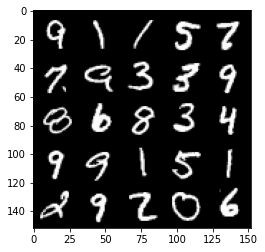

Epoch 171, step 80500: Generator loss: 1.3926103560924523, discriminator loss: 0.44788870054483443


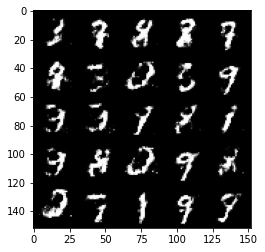

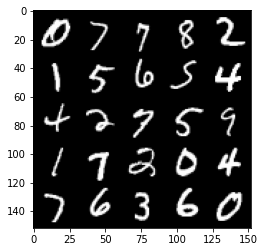

Epoch 172, step 81000: Generator loss: 1.4081429257392868, discriminator loss: 0.44830411344766585


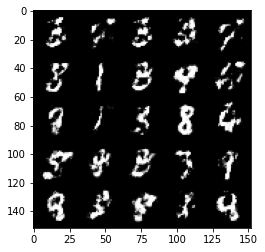

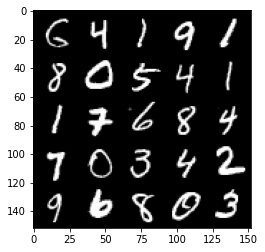

Epoch 173, step 81500: Generator loss: 1.4005831544399252, discriminator loss: 0.4476656712293623


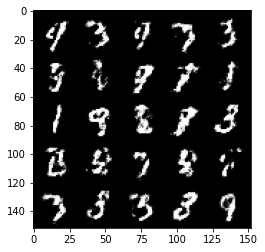

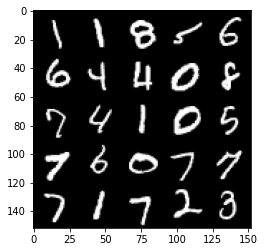

Epoch 174, step 82000: Generator loss: 1.3826220030784606, discriminator loss: 0.45654490774869966


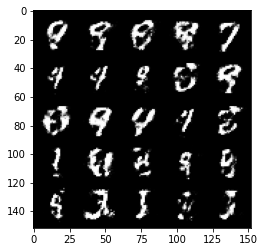

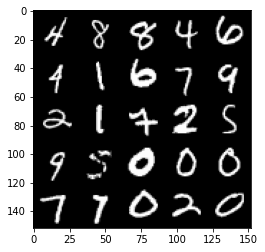

Epoch 175, step 82500: Generator loss: 1.4403055689334874, discriminator loss: 0.4293120268583297


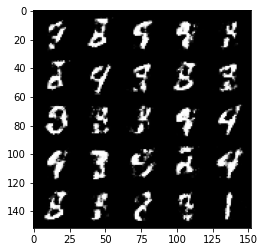

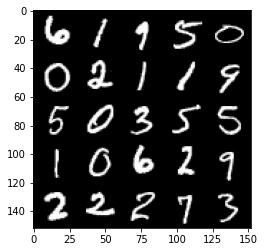

Epoch 176, step 83000: Generator loss: 1.4889318385124213, discriminator loss: 0.41744364345073687


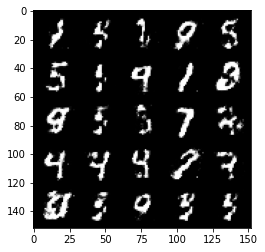

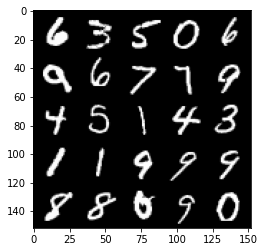

Epoch 178, step 83500: Generator loss: 1.4093978977203352, discriminator loss: 0.43939420419931363


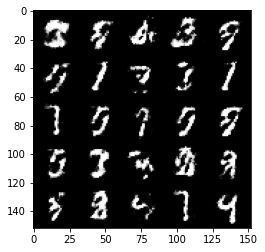

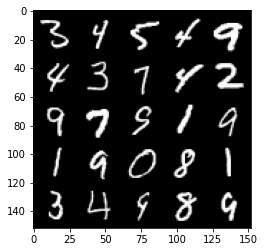

Epoch 179, step 84000: Generator loss: 1.3904535565376284, discriminator loss: 0.43920730233192423


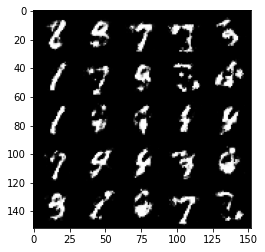

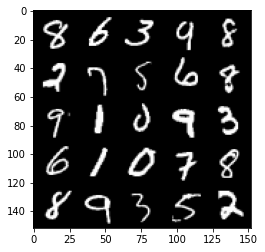

Epoch 180, step 84500: Generator loss: 1.3761435370445259, discriminator loss: 0.45572771239280674


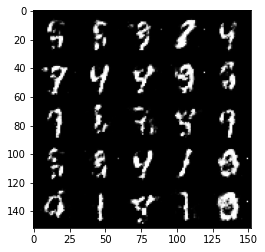

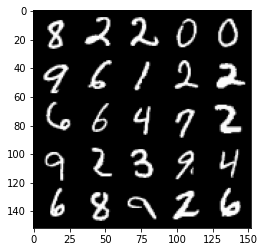

Epoch 181, step 85000: Generator loss: 1.2435091750621792, discriminator loss: 0.4754438092112543


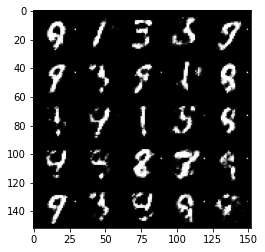

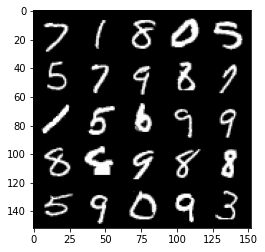

Epoch 182, step 85500: Generator loss: 1.5958667836189284, discriminator loss: 0.39952715656161353


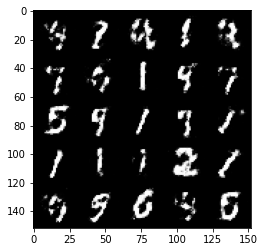

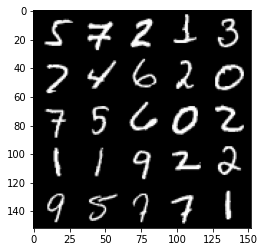

Epoch 183, step 86000: Generator loss: 1.3847286522388447, discriminator loss: 0.4393327427506445


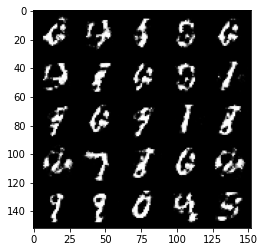

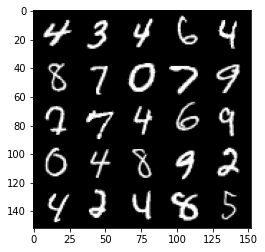

Epoch 184, step 86500: Generator loss: 1.4591361107826244, discriminator loss: 0.4210998423099518


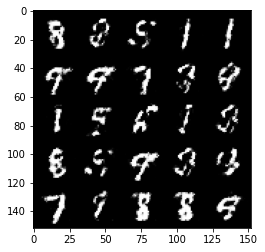

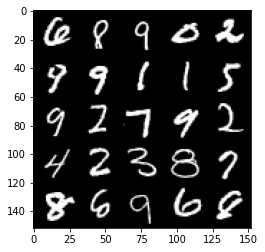

Epoch 185, step 87000: Generator loss: 1.4200096642971047, discriminator loss: 0.4303614329695702


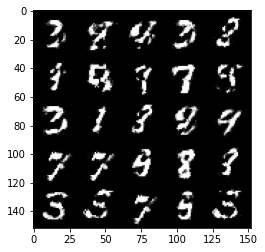

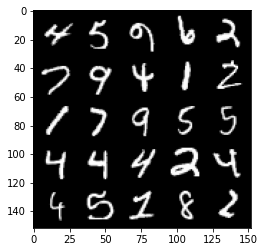

Epoch 186, step 87500: Generator loss: 1.408007905483246, discriminator loss: 0.4380903275609017


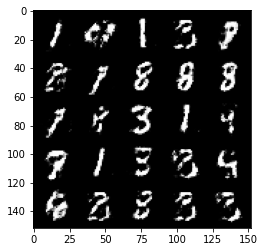

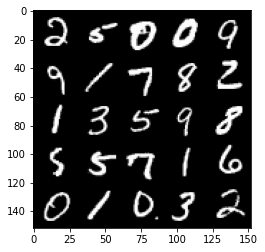

Epoch 187, step 88000: Generator loss: 1.3447131333351137, discriminator loss: 0.4452081732749941


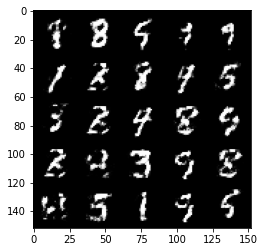

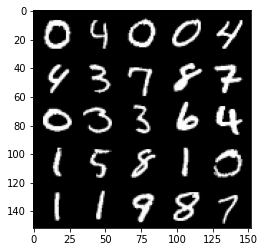

Epoch 188, step 88500: Generator loss: 1.419482206106186, discriminator loss: 0.4377307092547417


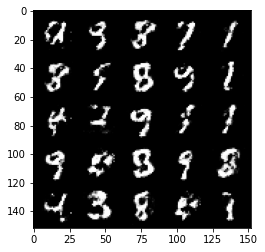

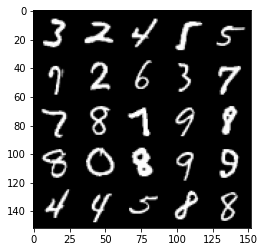

Epoch 189, step 89000: Generator loss: 1.425983266592027, discriminator loss: 0.4234398570656772


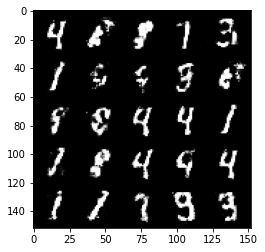

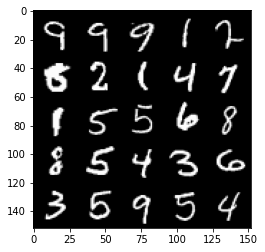

Epoch 190, step 89500: Generator loss: 1.4002306241989138, discriminator loss: 0.44220338565111234


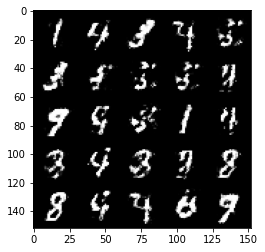

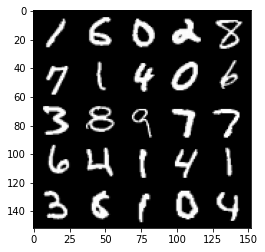

Epoch 191, step 90000: Generator loss: 1.4256241619586951, discriminator loss: 0.43247011077403996


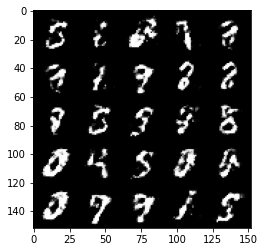

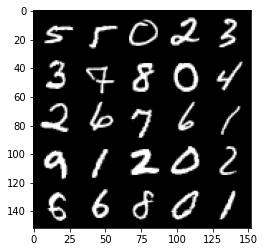

Epoch 192, step 90500: Generator loss: 1.330001282453538, discriminator loss: 0.45197672325372695


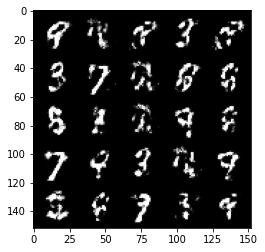

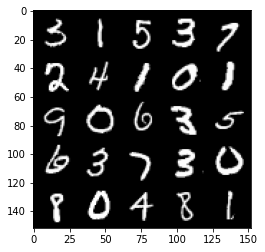

Epoch 194, step 91000: Generator loss: 1.326954638004302, discriminator loss: 0.4735899696350098


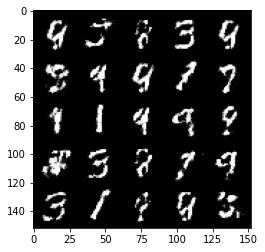

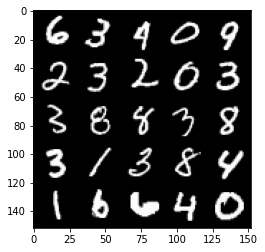

Epoch 195, step 91500: Generator loss: 1.307980897426606, discriminator loss: 0.47327911186218247


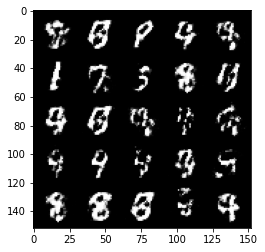

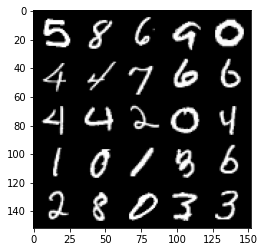

Epoch 196, step 92000: Generator loss: 1.259640437602996, discriminator loss: 0.4784065756201743


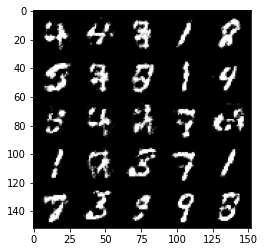

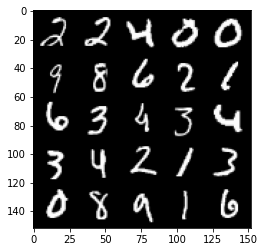

Epoch 197, step 92500: Generator loss: 1.3216682753562914, discriminator loss: 0.44898240119218824


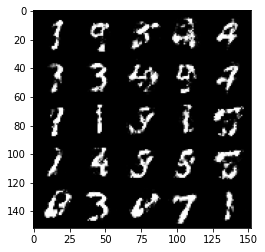

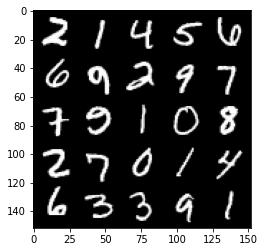

Epoch 198, step 93000: Generator loss: 1.296715830087662, discriminator loss: 0.4632651057243344


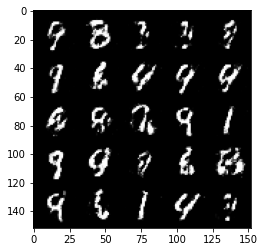

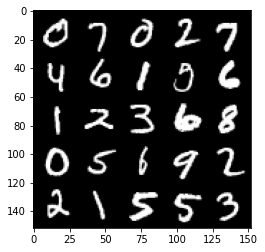

Epoch 199, step 93500: Generator loss: 1.3245179743766797, discriminator loss: 0.45512774163484554


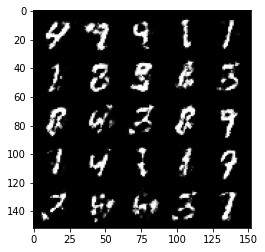

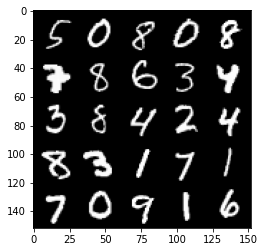

In [22]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()                        
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1